## Comparing Bayesian Models: The Widely Applicable Information Criterion
   
The Widely Applicable Information Criterion (WAIC) is an information criterion (such as AIC or BIC) that can be used in Bayesian models. The interesting aspect of the WAIC is that it is completely based on the likelihood of the posterior predictions. To compute the WAIC we have simply to be able to compute samples from the posterior, no matter which kind of posterior we are working with.

Let's $y_i$ be a target point in the training sample, we define $Pr(y_i)$ the average likelihood of the point under our model. This means that for each combination of posterior parameters of our model we can compute the associated likelihood of the point, and then average across all the likelihoods. This quantity is called *log-pointwise-predictive-density* (lppd):

$$ lppd = \sum_{i=1}^N \log[\overline{Pr(y_i)}]. $$

This is the equivalent of the deviance that is computed when computing the AIC. 
While *lppd* accounts for model fit, the second part of WAIC should penalize model complexity. Instead of computing the number of parameters, as in AIC or BIC, WAIC computed the variance $V(y_i)$ of the log-likelihood associated to each data point. In practice, we compute the likelihood of $y_i$ for each combination of parameters from our posterior, and then we compute the variance of these quantities. We therefore define the effective number of parameters $p_{WAIC}$ as:

$$ p_{WAIC} = \sum_{i=1}^N V(Pr(y_i)) .$$

WAIC is finally defined as 

$$ WAIC = -2 (lppd - p_{WAIC}) $$



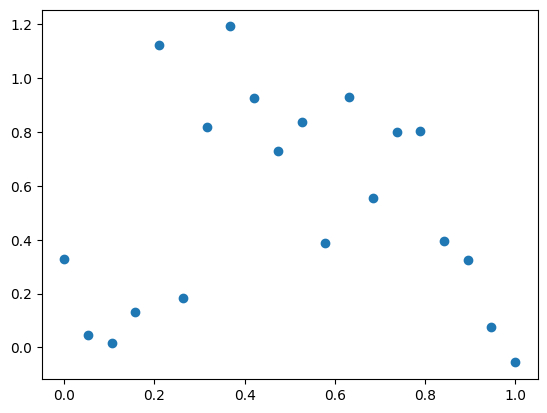

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy
from scipy.stats import norm
from tools import *

N = 20
noise = 0.3
x = np.linspace(0, 1, N)
y = np.sin(x * 3) + noise * np.random.randn(N)

data_synth = pd.DataFrame({"x": x, "y": y})

plt.scatter(x, y)


In [2]:
%run tools.py

degree = 9
likelihood = 'gaussian'

models = []

for i in range(degree):
    
    data_poly = pd.DataFrame({'y' : y})

    priors = []

    prior_a_mean = 0
    prior_a_sigma = 5
    prior_a = ['gaussian', [prior_a_mean, prior_a_sigma]]

    priors.append(prior_a)
    
    if i > 0:
        expr = 'y ~ '
        for k in range(1,i+1):
            if k>1:
                expr = expr + '+'
            prior_param_mean = 0
            prior_param_sigma = 5
            prior_param = ['gaussian', [prior_param_mean, prior_param_sigma]]
            priors.append(prior_param)
            data_poly['x'+str(k)] = x**k
            expr = expr + 'x' + str(k)

    sigma_inf = 0.1
    sigma_sup = 5
    prior_sigma_unif = [sigma_inf, sigma_sup]
    prior_sigma = ['uniform', prior_sigma_unif]

    priors.append(prior_sigma)
    
    if i > 0:
        models.append(laplace_solution_regression(expr, data_poly, likelihood, priors))
    else:
        models.append(laplace_solution([1,1],[],data_poly['y'], likelihood, priors))   

      fun: 13.283854243889142
 hess_inv: array([[ 6.99457275e-03, -3.33230794e-05],
       [-3.33230794e-05,  3.64819838e-03]])
      jac: array([1.66893005e-06, 3.57627869e-07])
  message: 'Optimization terminated successfully.'
     nfev: 36
      nit: 7
     njev: 12
   status: 0
  success: True
        x: array([0.52797923, 0.38216023])


/home/joris/.local/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:576: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


      fun: 15.810045009455623
 hess_inv: array([[ 0.0267384 , -0.03913142, -0.00013592],
       [-0.03913142,  0.07853868,  0.00017801],
       [-0.00013592,  0.00017801,  0.00360121]])
      jac: array([3.57627869e-07, 3.57627869e-07, 3.57627869e-07])
  message: 'Optimization terminated successfully.'
     nfev: 98
      nit: 17
     njev: 24
   status: 0
  success: True
        x: array([ 0.53726586, -0.01857864,  0.38211455])


/home/joris/.local/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:576: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


      fun: 11.293727315690926
 hess_inv: array([[ 2.55600726e-02, -9.88719206e-02,  8.01567169e-02,
         5.05139750e-04],
       [-9.88719206e-02,  5.44605595e-01, -5.07798707e-01,
        -3.10638833e-03],
       [ 8.01567169e-02, -5.07798707e-01,  5.08350556e-01,
         3.05491488e-03],
       [ 5.05139750e-04, -3.10638833e-03,  3.05491488e-03,
         1.90173583e-03]])
      jac: array([-3.33786011e-06, -2.38418579e-06, -2.38418579e-06, -8.46385956e-06])
  message: 'Optimization terminated successfully.'
     nfev: 152
      nit: 23
     njev: 30
   status: 0
  success: True
        x: array([ 0.0278858 ,  3.22088835, -3.24520122,  0.26318795])


/home/joris/.local/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:576: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


      fun: 13.46285428967312
 hess_inv: array([[ 3.25981092e-02, -1.81558053e-01,  2.78101075e-01,
        -1.25003153e-01,  1.85998163e-04],
       [-1.81558053e-01,  1.71080637e+00, -3.53606440e+00,
         2.02673358e+00, -1.59658712e-03],
       [ 2.78101075e-01, -3.53606440e+00,  8.58559468e+00,
        -5.49485611e+00,  2.72597410e-03],
       [-1.25003153e-01,  2.02673358e+00, -5.49485611e+00,
         3.77168076e+00, -1.09194660e-03],
       [ 1.85998163e-04, -1.59658712e-03,  2.72597410e-03,
        -1.09194660e-03,  1.72573694e-03]])
      jac: array([8.94069672e-06, 2.26497650e-06, 3.69548798e-06, 3.81469727e-06,
       6.67572021e-06])
  message: 'Optimization terminated successfully.'
     nfev: 254
      nit: 34
     njev: 42
   status: 0
  success: True
        x: array([ 0.084842  ,  2.34742415, -0.89579379, -1.61111053,  0.26162092])
      fun: 15.990052850091566
 hess_inv: array([[ 3.30725040e-02, -1.78356332e-01,  2.31650613e-01,
        -6.25451481e-03, -8.07652305

/home/joris/.local/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:576: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/home/joris/.local/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:576: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


      fun: 18.51349242495513
 hess_inv: array([[ 2.71425304e-02, -1.42126208e-01,  1.80410812e-01,
         2.06869373e-03, -7.32076036e-02,  1.95467286e-03,
         5.45569837e-04],
       [-1.42126208e-01,  1.37958830e+00, -2.96416410e+00,
         1.30587257e+00,  1.24080918e+00, -7.88342984e-01,
        -4.71859533e-03],
       [ 1.80410812e-01, -2.96416410e+00,  9.73508773e+00,
        -8.52987488e+00, -2.22381380e+00,  3.79210493e+00,
         6.75232022e-03],
       [ 2.06869373e-03,  1.30587257e+00, -8.52987488e+00,
         1.40908853e+01, -5.14996889e+00, -1.82682779e+00,
         2.27363113e-03],
       [-7.32076036e-02,  1.24080918e+00, -2.22381380e+00,
        -5.14996889e+00,  1.38326661e+01, -7.67151135e+00,
        -6.22847986e-03],
       [ 1.95467286e-03, -7.88342984e-01,  3.79210493e+00,
        -1.82682779e+00, -7.67151135e+00,  6.66993936e+00,
         1.14374917e-03],
       [ 5.45569837e-04, -4.71859533e-03,  6.75232022e-03,
         2.27363113e-03, -6.22847986e

/home/joris/.local/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:576: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/home/joris/.local/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:576: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


      fun: 21.041041590218583
 hess_inv: array([[ 3.01996034e-02, -1.72582206e-01,  2.27157884e-01,
         1.00064528e-02, -8.93725311e-02,  1.28140724e-02,
        -2.82185962e-02, -2.78887336e-04],
       [-1.72582206e-01,  1.77854388e+00, -3.49032629e+00,
         1.00381049e+00,  1.68609219e+00, -1.53351199e+00,
         8.34114417e-01,  1.39145066e-02],
       [ 2.27157884e-01, -3.49032629e+00,  9.75316099e+00,
        -7.12111760e+00, -3.23699622e+00,  6.62623261e+00,
        -2.91855796e+00, -3.90362201e-02],
       [ 1.00064528e-02,  1.00381049e+00, -7.12111760e+00,
         1.43480808e+01, -6.97117886e+00, -6.00803307e+00,
         4.73298119e+00,  2.96949606e-02],
       [-8.93725311e-02,  1.68609219e+00, -3.23699622e+00,
        -6.97117886e+00,  1.74047419e+01, -5.71698158e+00,
        -3.16292693e+00,  7.09675595e-03],
       [ 1.28140724e-02, -1.53351199e+00,  6.62623261e+00,
        -6.00803307e+00, -5.71698158e+00,  9.78957427e+00,
        -3.16453075e+00, -4.34905595

/home/joris/.local/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:576: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/home/joris/.local/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:576: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


      fun: 23.568512104542258
 hess_inv: array([[ 3.10987832e-02, -1.74993588e-01,  2.35427337e-01,
         8.46749896e-03, -8.46606667e-02, -4.55252545e-02,
        -4.51022217e-02,  7.53568774e-02,  6.42218694e-04],
       [-1.74993588e-01,  1.71779460e+00, -3.40477291e+00,
         8.54321594e-01,  9.32888129e-01,  9.52567166e-01,
         3.29279641e-01, -1.20423568e+00, -3.51286944e-03],
       [ 2.35427337e-01, -3.40477291e+00,  9.62079781e+00,
        -6.46645080e+00, -1.18045481e+00, -6.68381999e-01,
        -9.45128141e-01,  2.84604661e+00,  3.19014117e-03],
       [ 8.46749896e-03,  8.54321594e-01, -6.46645080e+00,
         1.28049038e+01, -5.95975739e+00, -3.16996463e+00,
         2.65433238e-01,  1.62753587e+00,  4.64531977e-03],
       [-8.46606667e-02,  9.32888129e-01, -1.18045481e+00,
        -5.95975739e+00,  1.11767984e+01, -4.77846720e+00,
         4.03514142e+00, -4.20050087e+00,  5.82058988e-03],
       [-4.55252545e-02,  9.52567166e-01, -6.68381999e-01,
        -3

/home/joris/.local/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:576: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


      fun: 26.09247704626167
 hess_inv: array([[ 2.94676144e-02, -1.66402054e-01,  2.20033891e-01,
         1.76779037e-02, -6.52560790e-02, -6.13278860e-02,
        -3.44554894e-02,  8.92881173e-03,  4.97685212e-02,
         5.04252135e-04],
       [-1.66402054e-01,  1.73792253e+00, -3.58263744e+00,
         8.93274246e-01,  1.27882967e+00,  6.07792298e-01,
         2.21485850e-01, -2.40177117e-01, -7.52016132e-01,
        -3.83660529e-03],
       [ 2.20033891e-01, -3.58263744e+00,  1.04763819e+01,
        -6.68820569e+00, -2.98978698e+00,  1.67304643e-01,
         1.11967151e+00,  1.58109611e-01,  1.15638784e+00,
         1.55715738e-03],
       [ 1.76779037e-02,  8.93274246e-01, -6.68820569e+00,
         1.21018665e+01, -3.13658005e+00, -4.13260320e+00,
        -3.14612006e+00,  3.82209472e+00,  2.93559816e-01,
         1.15376874e-02],
       [-6.52560790e-02,  1.27882967e+00, -2.98978698e+00,
        -3.13658005e+00,  9.55982420e+00, -2.24982676e+00,
         1.45624684e+00, -7.10

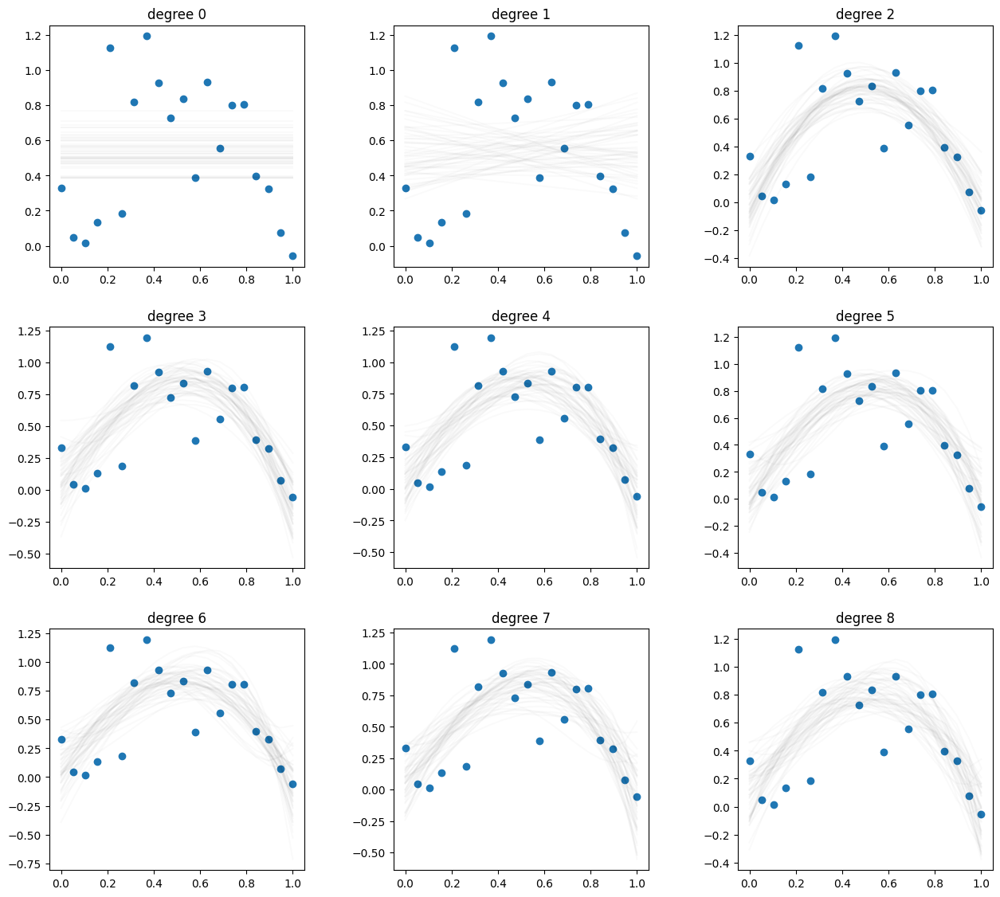

In [3]:
N_samp = 50

for i in range(degree):
    plt.subplot(int(float(degree)/3)+1,3,i+1)

    samples = post_sample_Laplace(models[i], N_samp)
    for l in range(N_samp):
        if i>0:
            pred = np.sum([x**k * samples[l,k] for k in range(i+1)],0)
        else:
            pred = x**0 * samples[l,0]
        plt.plot(x,pred, color = 'black', alpha = 0.02)
    
    plt.scatter(x,y)
    plt.title('degree ' + str(i))    
    plt.subplots_adjust(top=3, bottom=0.001, left=0.10, right=1.95, hspace=0.25,wspace=0.35)

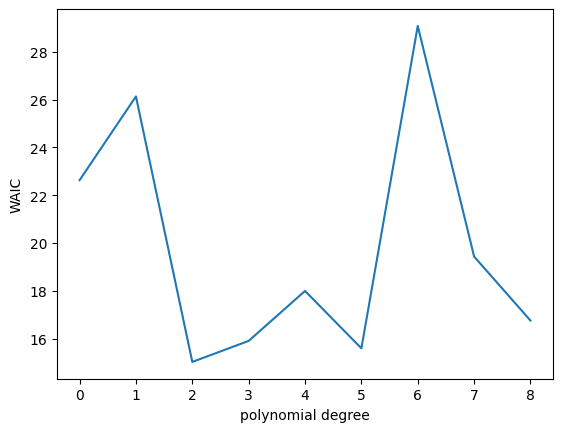

In [12]:
import scipy

WAIC = []

N_samp = 1000

for deg in range(degree):
  lppd = 0
  p_waic = 0
  samples = post_sample_Laplace(models[deg], N_samp)
  for k, target in enumerate(y):
    log_p = []
    for sample_idx in range(len(samples)):
      if deg > 0:
        pred = np.sum([x[k] ** power * samples[sample_idx, power] for power in range(deg + 1)], 0)
        log_p.append(norm.logpdf(target, pred, samples[sample_idx][-1]))
      else:
        pred = x[k] ** 0 * samples[sample_idx, 0]
        log_p.append(norm.logpdf(target, pred, samples[sample_idx][-1]))

    # From a vector of logs, apply exp, then sum, then apply log
    # Finally, substract log of number of samples to replace the mean before log
    lppd += scipy.special.logsumexp(log_p) - np.log(len(log_p))
    p_waic += np.var(log_p)

  #    print(lppd, p_waic)

  WAIC.append(-2 * (lppd - p_waic))

plt.plot(range(degree), WAIC)
plt.xticks(range(degree))
plt.xlabel("polynomial degree")
plt.ylabel("WAIC")
plt.show()


**Exercise.** Compare a polynomial model of order 1 to the polynomial model of order 3 with Stan

In [5]:
import stan
import nest_asyncio as asyncio
import nest_asyncio
nest_asyncio.apply()

In [6]:
poly_model_1_code = """
data {
    int<lower=1> N;
    vector[N] y;
    vector[N] x1;
}
parameters {
    real a;
    real b1;
    real<lower=1e-4> sigma;
}
transformed parameters {
    vector[N] mu;
    mu = a + b1 * x1 ; 
}
model {
    sigma ~ cauchy(0,4);
    b1 ~ normal(0, 3);
    a ~ normal(0, 2);
    y ~ normal(mu, sigma);
}
"""


In [7]:
data_poly1 = dict(x1 = x, y = y, N=N)

In [8]:
seed = 123

posterior = stan.build(poly_model_1_code, data=data_poly1, random_seed=seed)


Building...



Building: found in cache, done.

In [9]:
fit = posterior.sample(num_chains=4, num_samples=1000)
df = fit.to_frame()


Sampling:   0%
Sampling:  25% (2000/8000)
Sampling:  50% (4000/8000)
Sampling:  75% (6000/8000)
Sampling: 100% (8000/8000)
Sampling: 100% (8000/8000), done.
Messages received during sampling:
  Gradient evaluation took 5e-05 seconds
  1000 transitions using 10 leapfrog steps per transition would take 0.5 seconds.
  Adjust your expectations accordingly!
  Gradient evaluation took 3.1e-05 seconds
  1000 transitions using 10 leapfrog steps per transition would take 0.31 seconds.
  Adjust your expectations accordingly!
  Gradient evaluation took 3.2e-05 seconds
  1000 transitions using 10 leapfrog steps per transition would take 0.32 seconds.
  Adjust your expectations accordingly!
  Gradient evaluation took 3.1e-05 seconds
  1000 transitions using 10 leapfrog steps per transition would take 0.31 seconds.
  Adjust your expectations accordingly!


In [10]:
import plotly.graph_objects as go
linear_pred = df["a"].to_numpy().reshape(-1, 1) + df["b1"].to_numpy().reshape(-1, 1) @ x.reshape(1, -1)
fig = go.Figure()
for pred in linear_pred:
  trace = go.Scatter(x=x, y=pred, marker=dict(color="blue"), opacity=0.01)
  fig.add_trace(trace)
fig.update_layout(showlegend=False)
fig

In [76]:
if 1 == 2:
  lppd = 0
  p_waic = 0
  samples = post_sample_Laplace(models[deg], N_samp)
  for k, target in enumerate(y):
    log_p = []
    for sample_idx in range(len(samples)):
      if deg > 0:
        pred = np.sum(
          [x[k] ** power * samples[sample_idx, power] for power in range(deg + 1)], 0
        )
        log_p.append(norm.logpdf(target, pred, samples[sample_idx][-1]))
      else:
        pred = x[k] ** 0 * samples[sample_idx, 0]
        log_p.append(norm.logpdf(target, pred, samples[sample_idx][-1]))

    # From a vector of logs, apply exp, then sum, then apply log
    # Finally, substract log of number of samples to replace the mean before log
    lppd += scipy.special.logsumexp(log_p) - np.log(len(log_p))
    p_waic += np.var(log_p)

  #    print(lppd, p_waic)

  WAIC.append(-2 * (lppd - p_waic))


np.random.seed(42)


def linear_waic(x: list, y: list, df_opt: pd.DataFrame, n_samp: int = 1000):
  log_p = []
  lppd = 0
  p_waic = 0
  sample_indices = np.random.randint(low=0, high=len(df_opt), size=n_samp)
  for sample_idx in sample_indices:
    a, b1, sigma = df_opt.loc[sample_idx, ["a", "b1", "sigma"]]
    pred = a + b1 * x
    log_p.append(norm.logpdf(x=y, loc=pred, scale=sigma))

  lppd += scipy.special.logsumexp(log_p) - np.log(len(log_p))
  p_waic += np.var(log_p)

  waic = -2 * (lppd - p_waic)
  return waic


def cubic_waic(x: list, y: list, df_opt: pd.DataFrame, n_samp: int = 1000):
  log_p = []
  lppd = 0
  p_waic = 0
  sample_indices = np.random.randint(low=0, high=len(df_opt), size=n_samp)
  for sample_idx in sample_indices:
    a, b1, b2, b3, sigma = df_opt.loc[sample_idx, ["a", "b1", "b2", "b3", "sigma"]]
    pred = a + b1 * x + b2 * x**2 + b3 * x**3
    log_p.append(norm.logpdf(x=y, loc=pred, scale=sigma))

  lppd += scipy.special.logsumexp(log_p) - np.log(len(log_p))
  p_waic += np.var(log_p)

  waic = -2 * (lppd - p_waic)
  return waic


linear_waic(x=x, y=y, df_opt=df)


-4.603162187124286

In [58]:
poly_model_3_code = """
data {
    int<lower=1> N;
    vector[N] y;
    vector[N] x1;
}
parameters {
    real a;
    real b1;
    real b2;
    real b3;
    real<lower=1e-4> sigma;
}
transformed parameters {
    vector[N] mu;
    mu = a + b1 * x1 + b2 * x1^2 + b3 * x1^3 ; 
}
model {
    sigma ~ cauchy(0,4);
    b3 ~ normal(0, 3);
    b2 ~ normal(0, 3);
    b1 ~ normal(0, 3);
    a ~ normal(0, 2);
    y ~ normal(mu, sigma);
}
"""


In [59]:
data_poly1 = dict(x1 = x, y = y, N=N)

In [60]:
seed = 123

posterior_cubic = stan.build(poly_model_3_code, data=data_poly1, random_seed=seed)


Building...

In file included from /home/joris/.local/lib/python3.10/site-packages/httpstan/include/stan/math/prim/fun.hpp:124,
                 from /home/joris/.local/lib/python3.10/site-packages/httpstan/include/stan/math/rev/fun/multiply.hpp:7,
                 from /home/joris/.local/lib/python3.10/site-packages/httpstan/include/stan/math/rev/fun/elt_multiply.hpp:9,
                 from /home/joris/.local/lib/python3.10/site-packages/httpstan/include/stan/math/rev/fun.hpp:55,
                 from /home/joris/.local/lib/python3.10/site-packages/httpstan/include/stan/math/rev.hpp:10,
                 from /home/joris/.local/lib/python3.10/site-packages/httpstan/include/stan/math.hpp:19,
                 from /home/joris/.local/lib/python3.10/site-packages/httpstan/include/stan/model/model_header.hpp:4,
                 from /home/joris/.cache/httpstan/4.9.0/models/nmazoehk/model_nmazoehk.cpp:2:
/home/joris/.local/lib/python3.10/site-packages/httpstan/include/stan/math/prim/fun/grad_2F1.hpp: In


Building: 33.1s, done.

In [63]:
fit = posterior_cubic.sample(num_chains=4, num_samples=1000)
df_cubic = fit.to_frame()


Sampling:   0%
Sampling:   4% (300/8000)
Sampling:   8% (600/8000)
Sampling:  12% (1000/8000)
Sampling:  38% (3000/8000)
Sampling:  59% (4700/8000)
Sampling:  80% (6400/8000)
Sampling: 100% (8000/8000)
Sampling: 100% (8000/8000), done.
Messages received during sampling:
  Gradient evaluation took 3.7e-05 seconds
  1000 transitions using 10 leapfrog steps per transition would take 0.37 seconds.
  Adjust your expectations accordingly!
  Gradient evaluation took 3.2e-05 seconds
  1000 transitions using 10 leapfrog steps per transition would take 0.32 seconds.
  Adjust your expectations accordingly!
  Gradient evaluation took 4.3e-05 seconds
  1000 transitions using 10 leapfrog steps per transition would take 0.43 seconds.
  Adjust your expectations accordingly!
  Gradient evaluation took 3.2e-05 seconds
  1000 transitions using 10 leapfrog steps per transition would take 0.32 seconds.
  Adjust your expectations accordingly!


In [75]:
cubic_waic(x=x, y=y, df_opt=df_cubic, n_samp=1000)

-4.995225217808546

# Bayesian classification


In simple terms, classification implies estimating the probability of an observation to belong to a certain class, such as positive or negative, or 0 or 1. The classical model for estimating such as probability is the Binomial model:

$$ p(y) \sim Binomial(n,p), $$

where $y$ is the number of positive cases, $n$ is the total number of trials, and $p$ is the probability of a case being positive.  

As for linear regression our likelihood model was Gaussian, here our likelihood model will be Binomial. In linear regression, we were parameterizing the mean of the Gaussian model as a linear combination of the predictors:

$$ y_i \sim \mathcal{N}(\mu_i, \sigma),$$
$$ \mu_i = a + b x_i.$$

In the Binomial model, we parameterize the probability $p$ as a linear combination of the predictors:

$$y_i \sim Binomial(n, p_i)$$
$$f(p_i) = a + b x_i.$$

There are some issues to take into account. Since the probability $p_i$ must be greater than 0 and lower than 1, by parameterizing it directly with a linear model we will incour into problems, as this would not guarantee that the linear combination is bounded in the interval $[0,1]$. Therefore we need to *link* the probability $p_i$ to the linear model through some clever parameterization, called *link function*. A classical link function is called *logit* function, and is defined with respect to the log-odds:

$$f(p_i) = logit(p_i) = \log(odds(p_i)) = \log(\frac{p_i}{1-p_i}).$$

The odds is the ratio between probability of the outcome being positive and probability of being negative. Therefore is goes from 0 ($p_i=0$) to infinity ($p_i=1$). By taking the log, we transform the odds into a quantity that can range from $-\infty$ to $\infty$, a perfect variable to be described by a linear model.
We rewrite our Binomial link function:

$$ \log(\frac{p_i}{1-p_i}) = a + b x_i,$$

and we derive:

$$\frac{p_i}{1-p_i} = \exp(a + b x_i),$$
$$p_i = \frac{\exp(a + b x_i)}{1 + \exp(a + b x_i)}. $$




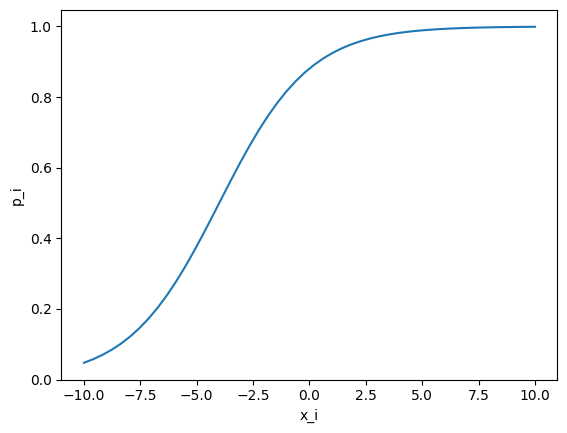

In [22]:
a = 2
b = 0.5

x_i = np.linspace(-10,10)

p_i = np.exp(a+b*x_i)/(1+np.exp(a+b*x_i))

plt.plot(x_i,p_i)
plt.xlabel('x_i')
plt.ylabel('p_i')
plt.show()



We recognize that the link function creates a non-linear association between $x_i$ and $p_i$, where $p_i$ is indeed bounded by 0 and 1. Importantly, although the association is linear, a unit increase in $x$ does not correspond anymore to a unit increase in the output. The magnitude of the association depends on the value of $x$ itself, and is greater in correspondence of the maximum slope of the curve. 

This kind of model is called *logistic regression*. 

## Example: Logistic regression for predicting Alzheimer's disease

In [24]:
data = pd.read_csv("adni_data.csv")
pd.set_option("mode.chained_assignment", None)

data_ct_ad = data.query("DX == 1 | DX == 3")
data_ct_ad["DX"] = data_ct_ad["DX"].map({1: 0, 3: 1})

data_ct_ad["norm_brain"] = data_ct_ad["WholeBrain.bl"] / data_ct_ad["ICV"]
data_ct_ad["norm_brain"] = (
  data_ct_ad["norm_brain"] - np.mean(data_ct_ad["norm_brain"])
) / np.std(data_ct_ad["norm_brain"])
data_ct_ad.dropna(inplace=True)


print(data_ct_ad[:5])


   RID  APOE4  DX   AGE  WholeBrain.bl           ICV  norm_brain
0    2    0.0   0  74.3      1229738.0  1.984657e+06   -0.907716
1    3    1.0   1  81.3      1129834.0  1.920691e+06   -1.508346
3    5    0.0   0  73.7      1116633.0  1.640766e+06    0.258629
5    7    1.0   1  75.4       875798.0  1.353519e+06   -0.382669
6    8    0.0   0  84.5       948684.0  1.396068e+06    0.239182


In [25]:
binomial_model_code = """
data {
  int<lower=1> N;
  int y[N];
  real x[N];
}
parameters {
  real a;
  real b;
}
transformed parameters {
  vector[N] p_i;
  for (i in 1:N) {
    p_i[i] = exp(a + b * x[i])/(1 + exp(a + b * x[i])); 
    }
}
model {
  b ~ normal(0, 3);
  a ~ normal(0, 3);
  y ~ binomial(1, p_i);
}
"""


In [26]:
data_to_stan = dict(
  x=np.array(data_ct_ad["norm_brain"]),
  y=np.array(data_ct_ad["DX"]),
  N=len(data_ct_ad["DX"]),
)

seed = 123

posterior = stan.build(binomial_model_code, data=data_to_stan, random_seed=seed)


Building...

/home/joris/.cache/httpstan/4.9.0/models/eu6ptuen/model_eu6ptuen.cpp: In constructor ‘model_eu6ptuen_namespace::model_eu6ptuen::model_eu6ptuen(stan::io::var_context&, unsigned int, std::ostream*)’:
/home/joris/.cache/httpstan/4.9.0/models/eu6ptuen/model_eu6ptuen.cpp:62:11: warning: variable ‘pos__’ set but not used [-Wunused-but-set-variable]
   62 |       int pos__ = std::numeric_limits<int>::min();
      |           ^~~~~
In file included from /home/joris/.local/lib/python3.10/site-packages/httpstan/include/stan/math/prim/fun.hpp:124,
                 from /home/joris/.local/lib/python3.10/site-packages/httpstan/include/stan/math/rev/fun/multiply.hpp:7,
                 from /home/joris/.local/lib/python3.10/site-packages/httpstan/include/stan/math/rev/fun/elt_multiply.hpp:9,
                 from /home/joris/.local/lib/python3.10/site-packages/httpstan/include/stan/math/rev/fun.hpp:55,
                 from /home/joris/.local/lib/python3.10/site-packages/httpstan/include/stan/math/r


Building: 28.8s, done.Messages from stanc:
Warning in '/tmp/httpstan_fsjzmchq/model_eu6ptuen.stan', line 4, column 2: Declaration
    of arrays by placing brackets after a variable name is deprecated and
    will be removed in Stan 2.32.0. Instead use the array keyword before the
    type. This can be changed automatically using the auto-format flag to
    stanc
Warning in '/tmp/httpstan_fsjzmchq/model_eu6ptuen.stan', line 5, column 2: Declaration
    of arrays by placing brackets after a variable name is deprecated and
    will be removed in Stan 2.32.0. Instead use the array keyword before the
    type. This can be changed automatically using the auto-format flag to
    stanc


In [27]:
fit = posterior.sample(num_chains=4, num_samples=1000)
df = fit.to_frame()
print(df.T[:10])

Sampling:   0%
Sampling:   1% (100/8000)
Sampling:   4% (300/8000)
Sampling:   6% (500/8000)
Sampling:   9% (700/8000)
Sampling:  14% (1100/8000)
Sampling:  19% (1500/8000)
Sampling:  25% (2000/8000)
Sampling:  31% (2500/8000)
Sampling:  50% (4000/8000)
Sampling:  68% (5400/8000)
Sampling:  84% (6700/8000)
Sampling: 100% (8000/8000)
Sampling: 100% (8000/8000), done.
Messages received during sampling:
  Gradient evaluation took 0.000466 seconds
  1000 transitions using 10 leapfrog steps per transition would take 4.66 seconds.
  Adjust your expectations accordingly!
  Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
  Exception: binomial_lpmf: Probability parameter[1] is -nan, but must be in the interval [0, 1] (in '/tmp/httpstan_912lsxgj/model_eu6ptuen.stan', line 20, column 2 to column 23)
  If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,


draws                0           1           2           3           4     \
parameters                                                                  
lp__          -459.480952 -459.641495 -459.366684 -459.391449 -460.669330   
accept_stat__    1.000000    0.863033    0.989330    0.995092    0.907469   
stepsize__       0.812881    0.859752    0.784821    0.819601    0.812881   
treedepth__      1.000000    2.000000    3.000000    2.000000    2.000000   
n_leapfrog__     1.000000    3.000000    7.000000    7.000000    3.000000   
divergent__      0.000000    0.000000    0.000000    0.000000    0.000000   
energy__       459.653417  462.655082  459.966797  459.624451  460.785556   
a               -0.527383   -0.511488   -0.540789   -0.535464   -0.494131   
b               -1.157090   -1.159228   -1.149301   -1.125972   -1.000162   
p_i.1            0.627832    0.631989    0.623035    0.619305    0.601982   

draws                5           6           7           8           9     

In [28]:
est_a = fit['a'][0]
quantiles_a = np.quantile(est_a, [0.05, 0.5, 0.95])

est_b = fit['b'][0]
quantiles_b = np.quantile(est_b, [0.05, 0.5, 0.95])

logistic_a_50 = np.exp(quantiles_a[1])/(1 + np.exp(quantiles_a[1]))
logistic_a_5 = np.exp(quantiles_a[0])/(1 + np.exp(quantiles_a[0]))
logistic_a_95 = np.exp(quantiles_a[2])/(1 + np.exp(quantiles_a[2]))

print('Baseline probability of disease: \n')
print('5%  :', logistic_a_5)
print('50% :', logistic_a_50)
print('95% :', logistic_a_95)


logistic_b_95 = np.exp(quantiles_a[0] - quantiles_b[0])/(1 + np.exp(quantiles_a[0] - quantiles_b[0]))
logistic_b_50 = np.exp(quantiles_a[0] - quantiles_b[1])/(1 + np.exp(quantiles_a[0] - quantiles_b[1]))
logistic_b_5 = np.exp(quantiles_a[0] - quantiles_b[2])/(1 + np.exp(quantiles_a[0] - quantiles_b[2]))


print('Probability increase for unit decrease in standardized brain volume (parameter "a" at lowest quantile): \n')
print('5%  :', logistic_b_5)
print('50% :', logistic_b_50)
print('95% :', logistic_b_95)

Baseline probability of disease: 

5%  : 0.3276064042904434
50% : 0.3585083699391747
95% : 0.39119459093440806
Probability increase for unit decrease in standardized brain volume (parameter "a" at lowest quantile): 

5%  : 0.5688532894770008
50% : 0.6059538072073966
95% : 0.6447632360686857


### Exercise

Is the probability of having a disease significantly different between $vol = -0.09$ and $vol = 1.2$.

In [56]:
df

parameters,lp__,accept_stat__,stepsize__,treedepth__,n_leapfrog__,divergent__,energy__,a,b,p_i.1,...,p_i.817,p_i.818,p_i.819,p_i.820,p_i.821,p_i.822,p_i.823,p_i.824,p_i.825,p_i.826
draws,,,,,,,,,,,,,,,,,,,,,
0,-459.480952,1.000000,0.812881,1.0,1.0,0.0,459.653417,-0.527383,-1.157090,0.627832,...,0.163805,0.207961,0.148471,0.280623,0.210309,0.284153,0.111732,0.056172,0.073740,0.097575
1,-459.641495,0.863033,0.859752,2.0,3.0,0.0,462.655082,-0.511488,-1.159228,0.631989,...,0.165711,0.210342,0.150204,0.283688,0.212715,0.287247,0.113033,0.056793,0.074577,0.098704
2,-459.366684,0.989330,0.784821,3.0,7.0,0.0,459.966797,-0.540789,-1.149301,0.623035,...,0.162987,0.206654,0.147815,0.278485,0.208975,0.281974,0.111435,0.056280,0.073745,0.097400
3,-459.391449,0.995092,0.819601,2.0,7.0,0.0,459.624451,-0.535464,-1.125972,0.619305,...,0.166782,0.210226,0.151622,0.281240,0.212529,0.284679,0.115100,0.059083,0.076929,0.100932
4,-460.669330,0.907469,0.812881,2.0,3.0,0.0,460.785556,-0.494131,-1.000162,0.601982,...,0.190407,0.232514,0.175371,0.299019,0.234711,0.302184,0.138206,0.077477,0.097469,0.123353
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3995,-459.339411,0.949226,0.819601,1.0,3.0,0.0,460.319432,-0.600929,-1.118530,0.602137,...,0.158827,0.200397,0.144358,0.268721,0.202605,0.272042,0.109564,0.056327,0.073278,0.096089
3996,-461.022060,0.911294,0.812881,1.0,1.0,0.0,461.220254,-0.568350,-0.967257,0.576798,...,0.183887,0.223504,0.169725,0.286096,0.225571,0.289079,0.134641,0.076838,0.095961,0.120574
3997,-462.126304,0.823667,0.859752,2.0,3.0,0.0,462.728689,-0.392589,-1.037041,0.633846,...,0.200852,0.246300,0.184621,0.317860,0.248670,0.321254,0.144551,0.079533,0.100835,0.128577


In [151]:
import plotly.express as px

np.random.seed(42)
vol = -0.9


def logit(a: float, b: float, x: float):
  return 1 / (1 + np.exp(-a + -b * x))


res_samples = pd.DataFrame()

indices = np.random.randint(low=0, high=len(df), size=100000)
a = df.loc[indices, "a"]
b = df.loc[indices, "b"]
for vol in [-0.9, 1.2]:
  samples = logit(a=a, b=b, x=vol)
  res_samples[str(vol)] = samples


fig = px.histogram(res_samples, x=["-0.9", "1.2"], nbins=100)

for q, v in res_samples.quantile([0.05, 0.95]).iterrows():
  fig.add_vline(x=v["-0.9"])
  fig.add_vline(x=v["1.2"])
fig


In [164]:
diff = res_samples["-0.9"] - res_samples["1.2"]
diff.name = "diff"

fig_diff = px.histogram(diff)

for q in [0.9, 0.99, 0.999, 0.9999]:
  diff_quantile = diff.quantile(q=1-q)
  fig_diff.add_vline(
    x=diff_quantile, annotation_position="top right", annotation_text=f"quantile {q}"
  )
fig_diff

### Exercise

Same, with two variables: `APOE4` and `norm_brain`.

In [166]:
binomial_model_code_2var = """
data {
  int<lower=1> N;
  int y[N];
  real x1[N];
  real x2[N];
}
parameters {
  real a;
  real b;
  real c;
}
transformed parameters {
  vector[N] p_i;
  for (i in 1:N) {
    p_i[i] = exp(a + b * x1[i] + c * x2[i])/(1 + exp(a + b * x1[i] + c * x2[i])); 
    }
}
model {
  c ~ normal(0, 3);
  b ~ normal(0, 3);
  a ~ normal(0, 3);
  y ~ binomial(1, p_i);
}
"""


In [167]:
data_to_stan = dict(
  x1=np.array(data_ct_ad["norm_brain"]),
  x2=np.array(data_ct_ad["APOE4"]),
  y=np.array(data_ct_ad["DX"]),
  N=len(data_ct_ad["DX"]),
)

seed = 123

posterior = stan.build(binomial_model_code_2var, data=data_to_stan, random_seed=seed)


Building...

/home/joris/.cache/httpstan/4.9.0/models/ybzufrsk/model_ybzufrsk.cpp: In constructor ‘model_ybzufrsk_namespace::model_ybzufrsk::model_ybzufrsk(stan::io::var_context&, unsigned int, std::ostream*)’:
/home/joris/.cache/httpstan/4.9.0/models/ybzufrsk/model_ybzufrsk.cpp:67:11: warning: variable ‘pos__’ set but not used [-Wunused-but-set-variable]
   67 |       int pos__ = std::numeric_limits<int>::min();
      |           ^~~~~
In file included from /home/joris/.local/lib/python3.10/site-packages/httpstan/include/stan/math/prim/fun.hpp:124,
                 from /home/joris/.local/lib/python3.10/site-packages/httpstan/include/stan/math/rev/fun/multiply.hpp:7,
                 from /home/joris/.local/lib/python3.10/site-packages/httpstan/include/stan/math/rev/fun/elt_multiply.hpp:9,
                 from /home/joris/.local/lib/python3.10/site-packages/httpstan/include/stan/math/rev/fun.hpp:55,
                 from /home/joris/.local/lib/python3.10/site-packages/httpstan/include/stan/math/r


Building: 33.1s, done.Messages from stanc:
Warning in '/tmp/httpstan_ggvt_vq7/model_ybzufrsk.stan', line 4, column 2: Declaration
    of arrays by placing brackets after a variable name is deprecated and
    will be removed in Stan 2.32.0. Instead use the array keyword before the
    type. This can be changed automatically using the auto-format flag to
    stanc
Warning in '/tmp/httpstan_ggvt_vq7/model_ybzufrsk.stan', line 5, column 2: Declaration
    of arrays by placing brackets after a variable name is deprecated and
    will be removed in Stan 2.32.0. Instead use the array keyword before the
    type. This can be changed automatically using the auto-format flag to
    stanc
Warning in '/tmp/httpstan_ggvt_vq7/model_ybzufrsk.stan', line 6, column 2: Declaration
    of arrays by placing brackets after a variable name is deprecated and
    will be removed in Stan 2.32.0. Instead use the array keyword before the
    type. This can be changed automatically using the auto-format flag to


In [168]:
fit = posterior.sample(num_chains=4, num_samples=1000)
df = fit.to_frame()
print(df.T[:10])

Sampling:   0%
Sampling:   1% (100/8000)
Sampling:   2% (200/8000)
Sampling:   4% (300/8000)
Sampling:   5% (400/8000)
Sampling:   8% (600/8000)
Sampling:  10% (800/8000)
Sampling:  12% (1000/8000)
Sampling:  15% (1200/8000)
Sampling:  18% (1400/8000)
Sampling:  20% (1600/8000)
Sampling:  24% (1900/8000)
Sampling:  26% (2100/8000)
Sampling:  29% (2300/8000)
Sampling:  31% (2500/8000)
Sampling:  34% (2700/8000)
Sampling:  36% (2900/8000)
Sampling:  39% (3100/8000)
Sampling:  55% (4400/8000)
Sampling:  70% (5600/8000)
Sampling:  86% (6900/8000)
Sampling: 100% (8000/8000)
Sampling: 100% (8000/8000), done.
Messages received during sampling:
  Gradient evaluation took 0.004838 seconds
  1000 transitions using 10 leapfrog steps per transition would take 48.38 seconds.
  Adjust your expectations accordingly!
  Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
  Exception: binomial_lpmf: Probability parameter[2] is -nan, but must be 

draws                0           1           2           3           4     \
parameters                                                                  
lp__          -389.411948 -390.116505 -388.667615 -390.062311 -389.203291   
accept_stat__    0.935840    0.836874    0.991876    0.809294    0.989149   
stepsize__       0.511696    0.569469    0.552956    0.511920    0.511696   
treedepth__      2.000000    2.000000    3.000000    1.000000    4.000000   
n_leapfrog__     3.000000    3.000000    7.000000    1.000000   15.000000   
divergent__      0.000000    0.000000    0.000000    0.000000    0.000000   
energy__       390.696736  391.285686  389.515852  390.133368  389.767218   
a               -1.305976   -1.592386   -1.497466   -1.529927   -1.396845   
b               -1.185499   -1.308707   -1.280284   -1.175624   -1.140114   
c                1.466273    1.825000    1.563713    1.462311    1.442209   

draws                5           6           7           8           9     

In [169]:
df

parameters,lp__,accept_stat__,stepsize__,treedepth__,n_leapfrog__,divergent__,energy__,a,b,c,...,p_i.817,p_i.818,p_i.819,p_i.820,p_i.821,p_i.822,p_i.823,p_i.824,p_i.825,p_i.826
draws,,,,,,,,,,,,,,,,,,,,,
0,-389.411948,0.935840,0.511696,2.0,3.0,0.0,390.696736,-1.305976,-1.185499,1.466273,...,0.080479,0.105671,0.251826,0.150571,0.107054,0.438806,0.194123,0.025174,0.131004,0.045446
1,-390.116505,0.836874,0.569469,2.0,3.0,0.0,391.285686,-1.592386,-1.308707,1.825000,...,0.055216,0.075273,0.241146,0.112984,0.076398,0.446229,0.180093,0.014963,0.115771,0.028977
2,-388.667615,0.991876,0.552956,3.0,7.0,0.0,389.515852,-1.497466,-1.280284,1.563713,...,0.061938,0.083664,0.217070,0.123951,0.084877,0.407926,0.161906,0.017364,0.104307,0.033078
3,-390.062311,0.809294,0.511920,1.0,1.0,0.0,390.133368,-1.529927,-1.175624,1.462311,...,0.065965,0.086845,0.213089,0.124494,0.087996,0.384489,0.162715,0.020617,0.108812,0.037176
4,-389.203291,0.989149,0.511696,4.0,15.0,0.0,389.767218,-1.396845,-1.140114,1.442209,...,0.077025,0.100215,0.239394,0.141273,0.101483,0.414501,0.185769,0.025152,0.126920,0.044403
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3995,-390.239068,0.880152,0.511920,2.0,3.0,0.0,390.807213,-1.464328,-1.402062,1.471684,...,0.057291,0.079756,0.186937,0.122823,0.081028,0.383865,0.134041,0.014145,0.081662,0.028729
3996,-393.260757,0.936419,0.511696,3.0,7.0,0.0,394.016605,-1.213884,-1.402302,1.336523,...,0.072400,0.100165,0.205053,0.152438,0.101727,0.411450,0.147955,0.018089,0.090700,0.036593
3997,-389.132077,1.000000,0.569469,2.0,3.0,0.0,390.391753,-1.469459,-1.218628,1.456760,...,0.067175,0.089284,0.214704,0.129491,0.090507,0.394040,0.162371,0.020122,0.106932,0.037083


In [186]:
px.histogram(df, "c", title="Values of the coefficient of APOE4")

In [213]:
def logit_2d(a: float, b: float, c: float, x_brain: pd.Series, x_apoe4: pd.Series):
  return 1 / (1 + np.exp(-a - b * x_brain - c * x_apoe4))


np.random.seed(42)
apoe4 = 0
vol = -0.9

res_samples = pd.DataFrame()

indices = np.random.randint(low=0, high=len(df), size=1000)
a = df.loc[indices, "a"]
b = df.loc[indices, "b"]
c = df.loc[indices, "c"]

for apoe4 in [0, 1, 2]:
  samples = logit_2d(a=a, b=b, c=c, x_brain=vol, x_apoe4=apoe4)
  res_samples[f"apoe4_{apoe4}"] = samples

fig = px.histogram(res_samples, nbins=200)

for q, v in res_samples.quantile([0.05, 0.95]).iterrows():
  fig.add_vline(x=v["apoe4_0"])
  fig.add_vline(x=v["apoe4_1"])
  fig.add_vline(x=v["apoe4_2"])
fig


In [212]:
mean_apoe4_0 = res_samples.mean()["apoe4_0"]
mean_apoe4_1 = res_samples.mean()["apoe4_1"]
mean_apoe4_2 = res_samples.mean()["apoe4_2"]
for comp in range(3):
  for baseline in range(comp):
    mean_apoe4_baseline = res_samples.mean()[f"apoe4_{baseline}"]
    mean_apoe4_comp = res_samples.mean()[f"apoe4_{comp}"]
    print(f"Increase in probability between APOE4 = {baseline} and APOE4 = {comp} is {(mean_apoe4_comp - mean_apoe4_baseline):.4f}")

Increase in probability between APOE4 = 0 and APOE4 = 1 is 0.3582
Increase in probability between APOE4 = 0 and APOE4 = 2 is 0.5274
Increase in probability between APOE4 = 1 and APOE4 = 2 is 0.1692


In [ ]:
diff = res_samples["-0.9"] - res_samples["1.2"]
diff.name = "diff"

fig_diff = px.histogram(diff)

for q in [0.9, 0.99, 0.999, 0.9999]:
  diff_quantile = diff.quantile(q=1-q)
  fig_diff.add_vline(
    x=diff_quantile, annotation_position="top right", annotation_text=f"quantile {q}"
  )
fig_diff

___

In [29]:
p_i = fit['p_i']
print(p_i.shape)

(826, 4000)


In [30]:
lppd = []
pwaic = []
for i in range(len(data_ct_ad)):
  id_log_lik = []
  for k in range(1000):
    p = p_i[i, k]
    id_log_lik.append(scipy.stats.binom.logpmf(data_ct_ad["DX"].values[i], 1, p))
  lppd.append(scipy.special.logsumexp(id_log_lik) - np.log(len(id_log_lik)))
  pwaic.append(np.var(id_log_lik))

waic = -2 * (np.sum(lppd) - np.sum(pwaic))


KeyboardInterrupt: 

What happens when we include another predictor, for example the presence of the genetic mutation APOE4?

In [ ]:
binomial_model_code_2 = """
data {
  int<lower=1> N;
  int y[N];
  real x[N];
  real x_g[N];
}
parameters {
  real a;
  real b;
  real c;
}
transformed parameters {
  vector[N] p_i;
  for (i in 1:N) {
    p_i[i] = exp(a + b * x[i] + c * x_g[i])/(1 + exp(a + b * x[i] + c * x_g[i])); 
    }
}
model {
  c ~ normal(0, 3);
  b ~ normal(0, 3);
  a ~ normal(0, 3);
  y ~ binomial(1, p_i);
}
"""

In [ ]:
data_to_stan = dict(x = np.array(data_ct_ad['norm_brain']), 
                    x_g = np.array(data_ct_ad['APOE4']),
                    y = np.array(data_ct_ad['DX']), 
                    N = len(data_ct_ad['DX']))

seed = 123

posterior = stan.build(binomial_model_code_2, data=data_to_stan, random_seed=seed)

In [ ]:
fit = posterior.sample(num_chains=4, num_samples=1000)
df = fit.to_frame()
print(df.describe().T[:10])

Is this model better fitting the diagnosis than the previous one?

In [ ]:
p_i = fit['p_i']

lppd = []
pwaic = []
for i in range(len(data_ct_ad)):
    id_log_lik = []
    for k in range(1000):
        p = p_i[i,k]
        id_log_lik.append(scipy.stats.binom.logpmf(data_ct_ad['DX'].values[i], 1, p))
    lppd.append(scipy.special.logsumexp(id_log_lik) - np.log(len(id_log_lik)))
    pwaic.append(np.var(id_log_lik))

waic_apoe = -2 * (np.sum(lppd) -np.sum(pwaic))

In [ ]:
print(waic, waic_apoe)

### The cow exercise
Given to reactions to treatments on cows, is there a difference between both distributions?

In [94]:
import plotly.express as px
import plotly.graph_objects as go

mean_range = np.linspace(start=0, stop=1)

cow_b = np.array([0, 0, 1, 1, 1, 0, 1, 1, 1, 0])
cow = pd.DataFrame()
cow_a = np.array([0, 1, 0, 0, 0, 0, 1, 0, 0, 0])
cow["a"] = cow_a
cow["b"] = cow_b
cow

,a,b
0,0,0
1,1,0
2,0,1
3,0,1
4,0,1
5,0,0
6,1,1
7,0,1
8,0,1
9,0,0


In [ ]:

prior_mean_a = np.random.norm(loc=np.mean(cow_a), scale=np.std(cow_a))
prior_mean_b = np.random.norm(loc=np.mean(cow_b), scale=np.std(cow_b))

n_samples = 100
sample_size = 10
sample_indices = np.random.randint(low=0, high=len(cow_a), size=(n_samples, sample_size))

sample_cow_a = cow_a[sample_indices]
sample_cow_b = cow_b[sample_indices]

fig = go.Figure()
